# dida Task
## Predicting rooftop shape using satellite images
This file is intended as an intuitive and visually more appealling presentation of my submission, than the source code itself. Nevertheless, the source code should functionally (no pun intended) cover the same aspects and match the readability of this notebook. 

The main folder contains a requirements YAML file for conda users and a requirements.txt for pip users which has all the necessary packages listed needed to run this notebook, as well as the source code. The code was executed using a laptop with 32 GB RAM, an i7-11850H processor and a NVIDIA T1200 Laptop GPU (around 1 GB). 

At the end of the notebook I also mention additional points I would've liked to implement and test, however, as I work more than full-time, time constraints prohibited me from doing so. In my opinion this task was quite a bit of fun and I also learned a lot. Without further ado let us start.

In [1]:
import sys
sys.path.append('./src') # Add the src folder to the search path for modules

from data_load import *
from model_u_net import *
from train_helpers import *
from utils import *

## 1. Exploratory Data Analysis & Problem Statement
Before we start selecting and training a model, we have to formalize our problem statement, as well as performing some exploratory data analysis to verify data integrity and identify any unusual patterns. 

The problem in this task is to correctly predict rooftops in satellite images. Formally, this is an image segmentation task, where instead of classifying a single object in a picture or multiple objects in an image, we classify pixels in the images as belonging to the target class or not (binary segmentation). 

I've decided to use PyTorch for the implementation, as this is the library I'm most familiar with. As such we will start by creating a custom rooftop dataset class, inheriting from the Dataset class from PyTorch. Since there are only 30 images in total, I split the data manually in train, validation, and test set and stored the images and the labels (if they exist) in seperate folders. 

In [2]:
# Instantiate class from src
data_train = rooftops_dataset(data_dir=".\\data\\train")
data_val = rooftops_dataset(data_dir=".\\data\\validation")
data_test = rooftops_dataset(data_dir=".\\data\\test", test_set=True)

Let us iterate through the images of the train and validation set, plotting labels side by side to see if we notice anything unusual.

Image size is:  (256, 256)
Label size is:  (256, 256)


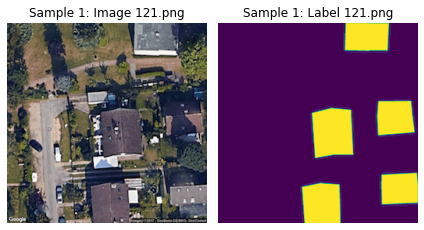

Image size is:  (256, 256)
Label size is:  (256, 256)


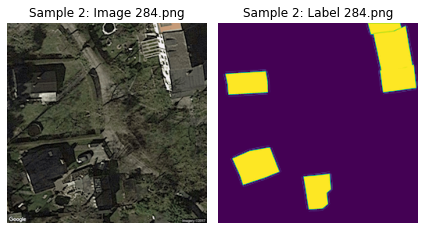

Image size is:  (256, 256)
Label size is:  (256, 256)


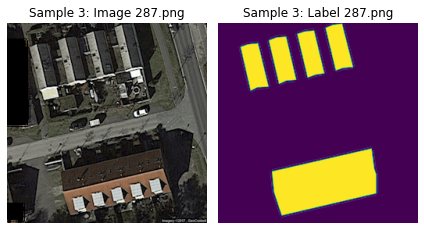

Image size is:  (256, 256)
Label size is:  (256, 256)


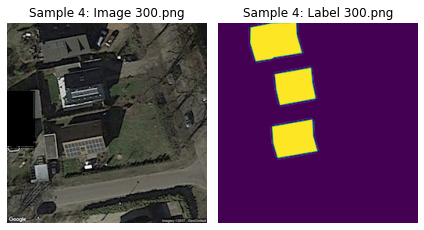

Image size is:  (256, 256)
Label size is:  (256, 256)


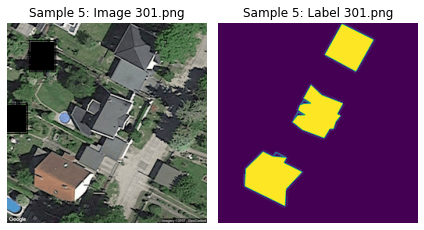

Image size is:  (256, 256)
Label size is:  (256, 256)


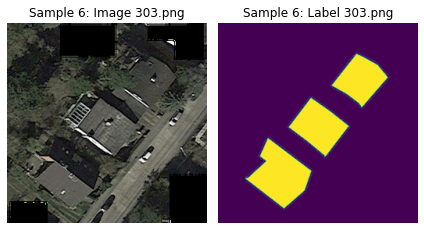

Image size is:  (256, 256)
Label size is:  (256, 256)


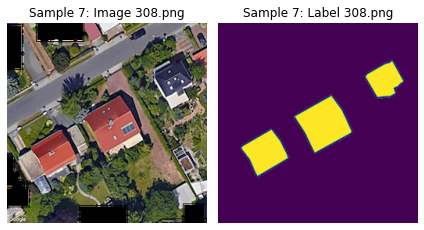

Image size is:  (256, 256)
Label size is:  (256, 256)


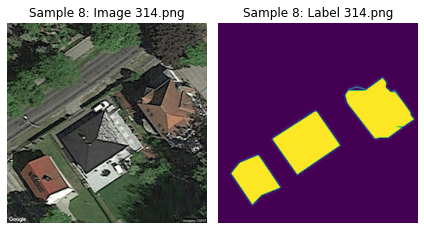

Image size is:  (256, 256)
Label size is:  (256, 256)


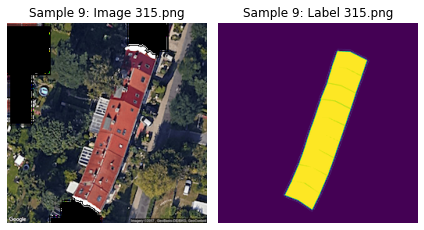

Image size is:  (256, 256)
Label size is:  (256, 256)


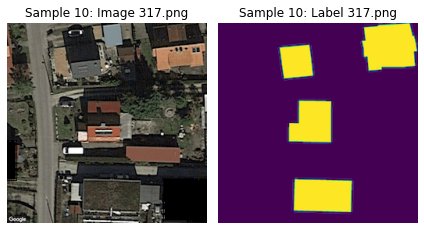

Image size is:  (256, 256)
Label size is:  (256, 256)


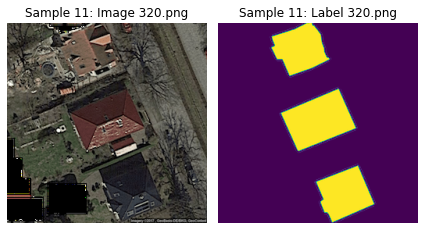

Image size is:  (256, 256)
Label size is:  (256, 256)


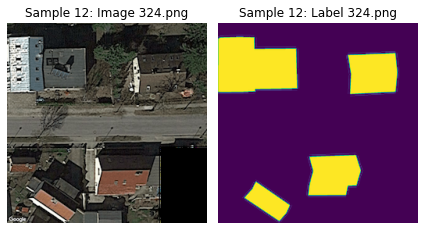

Image size is:  (256, 256)
Label size is:  (256, 256)


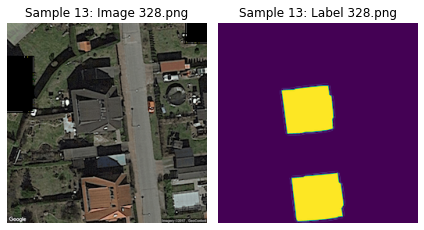

Image size is:  (256, 256)
Label size is:  (256, 256)


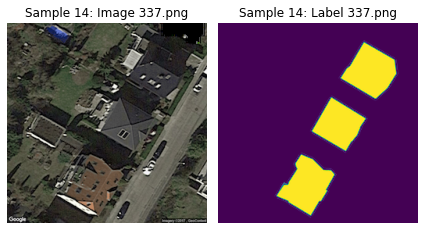

Image size is:  (256, 256)
Label size is:  (256, 256)


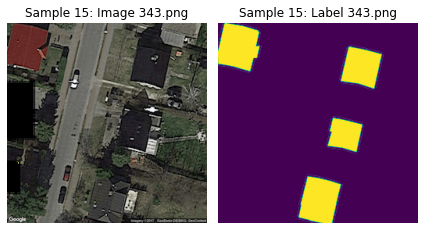

Image size is:  (256, 256)
Label size is:  (256, 256)


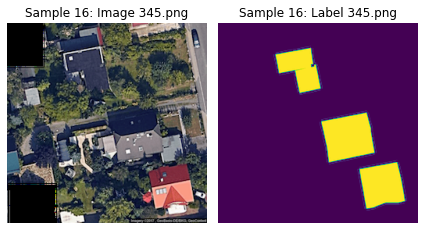

Image size is:  (256, 256)
Label size is:  (256, 256)


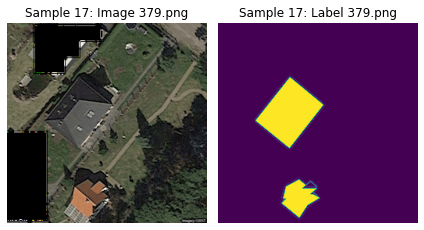

Image size is:  (256, 256)
Label size is:  (256, 256)


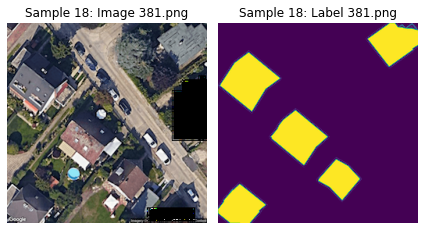

Image size is:  (256, 256)
Label size is:  (256, 256)


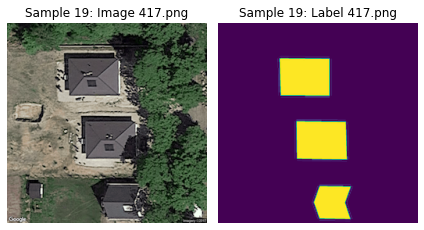

Image size is:  (256, 256)
Label size is:  (256, 256)


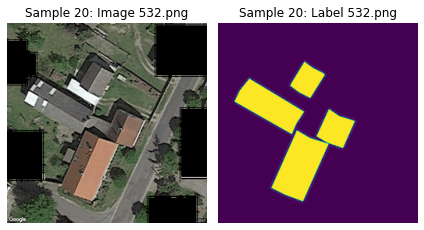

In [11]:
    # Train set
    for i, (sample, name) in enumerate(zip(data_train, data_train.filenames), start=1):
        print("Image size is: ", sample["image"].size)
        print("Label size is: ", sample["label"].size)

        # Reswap axis for plotting
        fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
        plt.interactive(False)
        ax1.imshow(sample["image"])
        ax1.axis("off")
        ax1.set_title(f"Sample {i}: Image {name}")

        ax2.imshow(sample["label"])
        ax2.axis("off")
        ax2.set_title(f"Sample {i}: Label {name}")

        plt.tight_layout()
        plt.show()

Image size is:  (256, 256)
Label size is:  (256, 256)


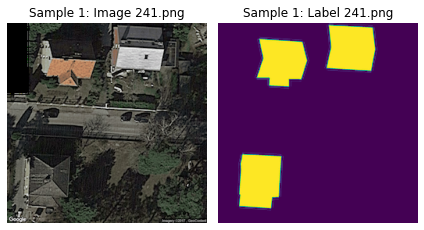

Image size is:  (256, 256)
Label size is:  (256, 256)


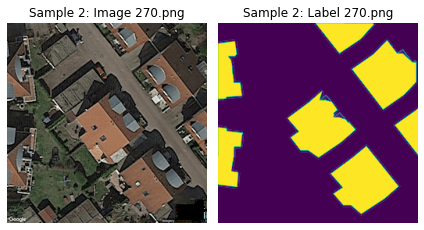

Image size is:  (256, 256)
Label size is:  (256, 256)


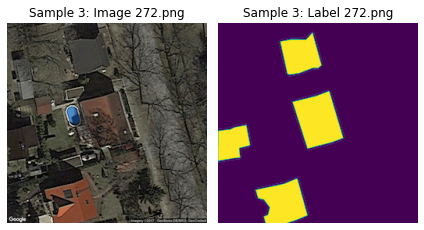

Image size is:  (256, 256)
Label size is:  (256, 256)


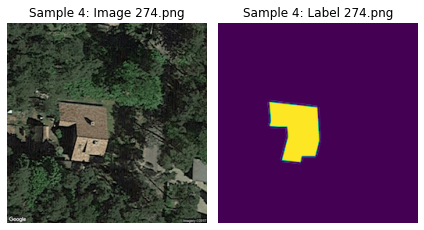

In [10]:
    # Validation set
    for i, (sample, name) in enumerate(zip(data_val, data_val.filenames), start=1):
        print("Image size is: ", sample["image"].size)
        print("Label size is: ", sample["label"].size)

        # Reswap axis for plotting
        fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
        plt.interactive(False)
        ax1.imshow(sample["image"])
        ax1.axis("off")
        ax1.set_title(f"Sample {i}: Image {name}")

        ax2.imshow(sample["label"])
        ax2.axis("off")
        ax2.set_title(f"Sample {i}: Label {name}")

        plt.tight_layout()
        plt.show()

Image size is:  (256, 256)


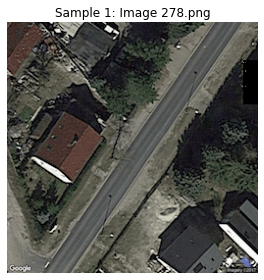

Image size is:  (256, 256)


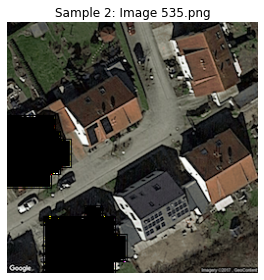

Image size is:  (256, 256)


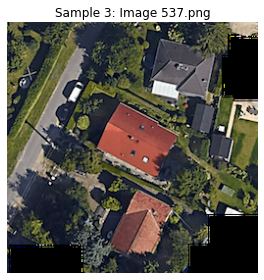

Image size is:  (256, 256)


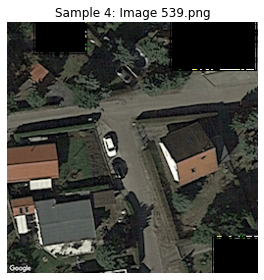

Image size is:  (256, 256)


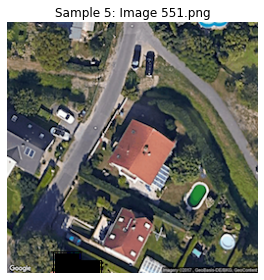

Image size is:  (256, 256)


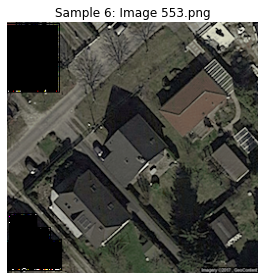

In [9]:
    # Test set
    for i, (sample, name) in enumerate(zip(data_test, data_test.filenames), start=1):
        print("Image size is: ", sample["image"].size)

        # Reswap axis for plotting
        fig, ax1 = plt.subplots(1, 1, sharey=True)
        plt.interactive(False)
        ax1.imshow(sample["image"])
        ax1.axis("off")
        ax1.set_title(f"Sample {i}: Image {name}")
        plt.tight_layout()
        plt.show()

We notice three things:
1. For some images, in particular 379, 327, and 274, most of the pixels in the image do not belong to the rooftop class;
2. The sizes of the images are identical (256 x 256), which makes our live easier when training our model;
3. For many images we see black boxes that were probably drawn due to privacy reasons. These might be problematic, as a model with high capacity could just overfit and use those boxes to identify specific rooftop patterns found in the training data, see also Clever Hans predictor https://www.nature.com/articles/s41467-019-08987-4. 

Two other things we noticed when we created the data set class:
1. The images are stored in the CMYK (or RGBA) format and the labels are not loaded in greyscale format. Our class converts the images to RGB, since virtually any image analysis nowadays uses the RGB color space. This also should not make a difference for a human to predict rooftops, so we would require the same from any model. Additonally, we convert the labels to greyscale;
2. For the image 278 (shown here in the test set) we have noticed that the corresponding label is actually the label of 270. We devised three strategies to deal with this

a.) Ignore this fact and just feed the image with the wrong label into the model (naive approach);\
b.) Drawing a label by our self for this image;\
c.) Move this image to the test set and handle it as such.

We will compare a.) and c.) later, although we suspect, that either b.) or c.) are the most promising one, as a.) bears the risk of model confusion. We will not try strategy b.) due to a lack of annotation expertise for image segmentation.

Let us now move forward to model selection.

## 2. Model Selection and Design
In this section we describe the model selection process and also the design of the model. We decided to use a U-Net architecture, as originally proposed in https://arxiv.org/abs/1505.04597 for biomedical image segmentation. The reason for this are threefold:
1. At the original time of release, this architecture proved to be groundbreaking and set new state-of-the-art results in (biomedical) image segmentation. Although recent advancement in image segmentation models improved on these results, it can still be considered as a solid baseline model that should perform at least better than other, more general architectures;
2. The design is straightforward and also the model size (in term of memory and parameters) is easy to handle (compared to current state-of-the-art architectures);
3. The U-Net architecture yields a relatively good (training) performance even with relatively few sample images.

Of course there would have been many alternatives, up to transfer-learning a state-of-the-art pretrained model, such as SWIN (https://arxiv.org/abs/2103.14030) a transformer model (which are now ubiquitous in deep learning). But given the reasons above, time constraints, and the desire to code the model from the ground up and see how good it performs as a baseline / straightforward solution, we opted for the use of the U-Net architecture.

The U-Net architecture can be understood as an encoder / decoder convolutional network with the additional trait, that it allows at each encoding stage for not only a contracting but also an expanding path, where the output of the encoder layer is used as input in the corresponding decoder layer, which enables localization of features. The original architecture is visualized in the following figure.
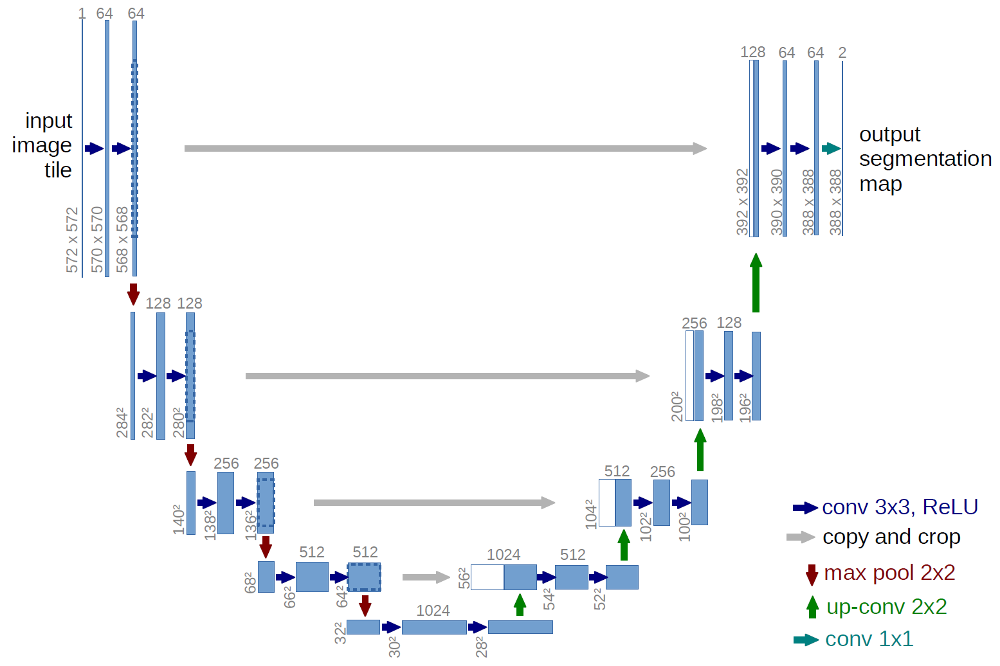

The main differences in our implementation are, that we do not use the same input / output size and we set at each convolution a zero padding border of size 1 (i.e. we pad the borders of the input), which not only yields different input / output sizes as in the picture, but also fixes one issue the original architecture had: For each expanding path the output image needed to be cropped to fit together into the decoder layer and the output of the model would not attain the same dimensions as the input. 
Otherwise, our implementation is the same, having two convolutional layers at each encoder / decoder layer and also performing max pooling at the end of each encoder layer and a transposed convolution at the end of each decoder layer (except the last one of course).

For the training we use the ADAM optimizer, which is a popular extension of stochastic gradient descent (SGD) algorithm utilizing additionally a momentum (the second moment of the gradient) and a variable learning rate for the parameters. 

We use the binary cross-entropy (BCE) loss as our loss function but extend our approach at a later run to test the performance improvement when using the so called dice loss (and an average of the BCE and the dice loss). We will explain the reasoning of using the dice loss later. 

We train the model for 100 epochs with a batch size of 4. We have tried different batch sizes at each model improvement iteration but they did not consistently lead to better results. Additionally we use early stopping, were we discontinue training if the validation loss does not improve over 11 epochs. Finally, we select the best model using the validation loss (and not just the model from the last epoch iteration). Let us first use just the default learning rate and see how we fare when ignoring our findings from EDA.

In [2]:
# Instantiate model
torch.manual_seed(42) # seed for reporducibility when using random weight initialization
model = UNet(256, 256).to(device)

# Set some parameters, instantiate the optimizer 
optimizer = torch.optim.Adam(model.parameters())
criterion = torch.nn.BCEWithLogitsLoss()
batch_size = 4
epochs_to_try = 100
patience = 11
modelname = ".\\models\\base_u_net" # Name of the saved model and the results.csv

# Create dataloaders from datasets
train_data_loader = DataLoader(
    rooftops_dataset(".\\data\\train",
                     transform=T.ToTensor()),
    shuffle=True,
    batch_size=batch_size
)
val_data_loader = DataLoader(
    rooftops_dataset(".\\data\\validation",
                     transform=T.ToTensor()),
    shuffle=False,
    batch_size=batch_size
)

dataloaders = {"train": train_data_loader,
               "validation": val_data_loader}

# Perform training
results = train_fun(model=model,
                    optimizer=optimizer,
                    data_loaders=dataloaders,
                    criterion=criterion,
                    device=device,
                    model_path=modelname,
                    epochs=epochs_to_try,
                    patience=patience)

Epoch: 5 | Avg. Train Loss:  0.385 | Avg. Val Loss:  0.386 | Learning Rate:  0.00100
Epoch: 10 | Avg. Train Loss:  0.351 | Avg. Val Loss:  0.348 | Learning Rate:  0.00100
Epoch: 15 | Avg. Train Loss:  0.303 | Avg. Val Loss:  0.324 | Learning Rate:  0.00100
Epoch: 20 | Avg. Train Loss:  0.294 | Avg. Val Loss:  0.312 | Learning Rate:  0.00100
Epoch: 25 | Avg. Train Loss:  0.292 | Avg. Val Loss:  0.312 | Learning Rate:  0.00100
Epoch: 30 | Avg. Train Loss:  0.271 | Avg. Val Loss:  0.284 | Learning Rate:  0.00100
Epoch: 35 | Avg. Train Loss:  0.283 | Avg. Val Loss:  0.298 | Learning Rate:  0.00100
Epoch: 40 | Avg. Train Loss:  0.275 | Avg. Val Loss:  0.312 | Learning Rate:  0.00100
Epoch: 45 | Avg. Train Loss:  0.265 | Avg. Val Loss:  0.293 | Learning Rate:  0.00100
Epoch: 50 | Avg. Train Loss:  0.277 | Avg. Val Loss:  0.299 | Learning Rate:  0.00100
Epoch: 55 | Avg. Train Loss:  0.239 | Avg. Val Loss:  0.261 | Learning Rate:  0.00100


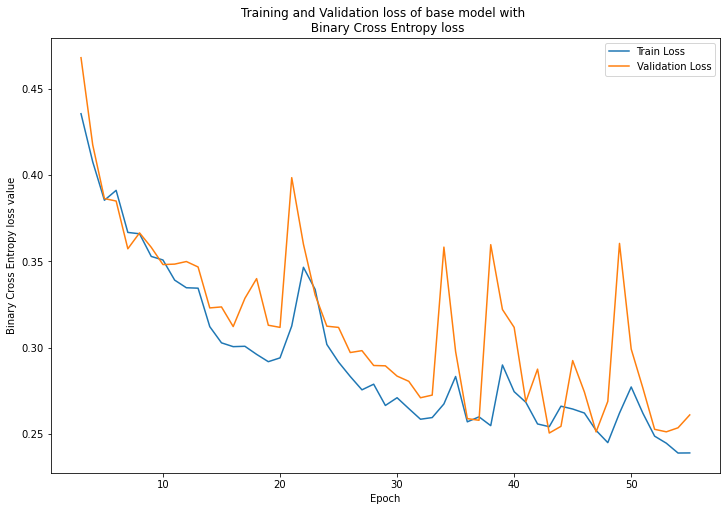

In [3]:
# Plot loss curves for train and validation set (excluding first 2 epochs to not mess up y-axis scaling)
results_path = modelname + "_results.csv"
plot_losses(results_path)

We see that training is ended prematurely by the early stopping criterion. Overall the first results look promising, as validation as well as train loss steadily decreases, albeit with significant spikes starting from epoch 20. Also our model does not seem to overfit (in the traditional sense), and the gap between validation and training error is not too large. Let us first check, if we can improve the performance by deploying a simple learning rate scheduler to reduce the amplitude of the spikes and hopefully, slightly increase the overall performance. We deploy an exponential lr scheduler, that reduces the learning rate with a multiplicative factor at each step. 

In [6]:
# Instantiate model
torch.manual_seed(42) # seed for reporducibility when using random weight initialization
model = UNet(256, 256).to(device)

# Set some parameters, instantiate the optimizer 
optimizer = torch.optim.Adam(model.parameters())
criterion = torch.nn.BCEWithLogitsLoss()
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.98)
batch_size = 4
epochs_to_try = 100
patience = 11
modelname = ".\\models\\base_u_net_lr_sched" # Name of the saved model and the results.csv

# Perform training
results = train_fun(model=model,
                    optimizer=optimizer,
                    data_loaders=dataloaders,
                    criterion=criterion,
                    device=device,
                    model_path=modelname,
                    scheduler=scheduler,
                    epochs=epochs_to_try,
                    patience=patience)

Epoch: 5 | Avg. Train Loss:  0.386 | Avg. Val Loss:  0.391 | Learning Rate:  0.00090
Epoch: 10 | Avg. Train Loss:  0.347 | Avg. Val Loss:  0.363 | Learning Rate:  0.00082
Epoch: 15 | Avg. Train Loss:  0.302 | Avg. Val Loss:  0.325 | Learning Rate:  0.00074
Epoch: 20 | Avg. Train Loss:  0.282 | Avg. Val Loss:  0.318 | Learning Rate:  0.00067
Epoch: 25 | Avg. Train Loss:  0.273 | Avg. Val Loss:  0.290 | Learning Rate:  0.00060
Epoch: 30 | Avg. Train Loss:  0.227 | Avg. Val Loss:  0.308 | Learning Rate:  0.00055
Epoch: 35 | Avg. Train Loss:  0.231 | Avg. Val Loss:  0.243 | Learning Rate:  0.00049
Epoch: 40 | Avg. Train Loss:  0.234 | Avg. Val Loss:  0.259 | Learning Rate:  0.00045
Epoch: 45 | Avg. Train Loss:  0.215 | Avg. Val Loss:  0.246 | Learning Rate:  0.00040
Epoch: 50 | Avg. Train Loss:  0.214 | Avg. Val Loss:  0.247 | Learning Rate:  0.00036
Epoch: 55 | Avg. Train Loss:  0.178 | Avg. Val Loss:  0.243 | Learning Rate:  0.00033
Epoch: 60 | Avg. Train Loss:  0.178 | Avg. Val Loss:  0

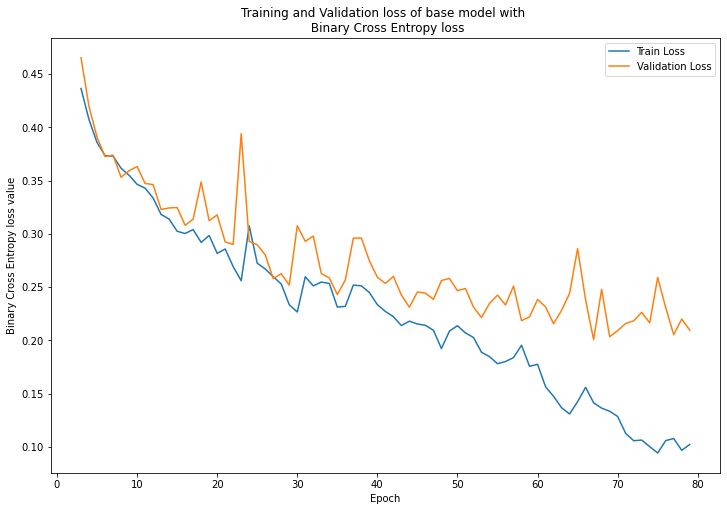

In [7]:
# Plot loss curves for train and validation set (excluding first 2 epochs to not mess up y-axis scaling)
results_path = modelname + "_results.csv"
plot_losses(results_path)

Splendid! We see that the overall amplitude of the spikes decreased by a large margin. However, we now have a different issue, namely overfitting. The train loss starts approaching 0, whereas the validation error plateaus. We thus need to combat overfitting.
Let us now adress this and the issues we found in EDA. Firstly, let us add a small fraction of Gaussian noise in an additive manner to each picture during training, to reduce the risk of learning privacy related black boxes instead of actual rooftops. Additionally, let us incorporate some basic augmentation strategies such as rotation and horizontal, as well as vertical flipping of the image. 

In particular, we will scale the added noise by a small factor, perform -90, 90, and 180 degrees rotations randomly, and horizontal and vertical flipping of the image each of which with some probably during batching of the data (i.e. within the data set getitem method). We had to implement those transformations manually, since except the noise those transformations would need to be applied to the label as well, however, PyTorch random based transformations are not guaranteed to yield the exact same transformation with each call (e.g. random rotation). Our function also allows for random hsv color jitter, but we will explain its usage later and also not use it right now.

In [7]:
# Instantiate model
torch.manual_seed(42) # seed for reporducibility when using random weight initialization
model = UNet(256, 256).to(device)

# Set some parameters, instantiate the optimizer 
optimizer = torch.optim.Adam(model.parameters())
criterion = torch.nn.BCEWithLogitsLoss()
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.98)
batch_size = 4
epochs_to_try = 100
patience = 11
modelname = ".\\models\\base_u_net_lr_augment" # Name of the saved model and the results.csv

# Augmentation params
augment_prob = {
        "p_hflip": 0.15,
        "p_vflip": 0.15,
        "p_rotation": 0.1,
        "p_noise" : 0.05,
        "p_hsv" : 0
    }
augment_params = {
    "noise_mean": 0.1,
    "noise_std": 1,
    "noise_scale": 0.002,
    "rot_angles": [-90, 90, 180],
    "hue_range": 0,
    "saturation_max": 0,
    "brightness_max": 0
}
augment_dict = {"probs": augment_prob, "params": augment_params}

# Create dataloaders from datasets with augmentation
train_data_loader = DataLoader(
    rooftops_dataset(".\\data\\train",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=True,
    batch_size=batch_size
)
val_data_loader = DataLoader(
    rooftops_dataset(".\\data\\validation",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=False,
    batch_size=batch_size
)

dataloaders = {"train": train_data_loader,
               "validation": val_data_loader}

# Perform training
results = train_fun(model=model,
                    optimizer=optimizer,
                    data_loaders=dataloaders,
                    criterion=criterion,
                    device=device,
                    model_path=modelname,
                    scheduler=scheduler,
                    epochs=epochs_to_try,
                    patience=patience)

Epoch: 5 | Avg. Train Loss:  0.382 | Avg. Val Loss:  0.392 | Learning Rate:  0.00090
Epoch: 10 | Avg. Train Loss:  0.348 | Avg. Val Loss:  0.362 | Learning Rate:  0.00082
Epoch: 15 | Avg. Train Loss:  0.304 | Avg. Val Loss:  0.394 | Learning Rate:  0.00074
Epoch: 20 | Avg. Train Loss:  0.285 | Avg. Val Loss:  0.282 | Learning Rate:  0.00067
Epoch: 25 | Avg. Train Loss:  0.293 | Avg. Val Loss:  0.366 | Learning Rate:  0.00060
Epoch: 30 | Avg. Train Loss:  0.293 | Avg. Val Loss:  0.286 | Learning Rate:  0.00055
Epoch: 35 | Avg. Train Loss:  0.282 | Avg. Val Loss:  0.312 | Learning Rate:  0.00049
Epoch: 40 | Avg. Train Loss:  0.251 | Avg. Val Loss:  0.279 | Learning Rate:  0.00045
Epoch: 45 | Avg. Train Loss:  0.234 | Avg. Val Loss:  0.260 | Learning Rate:  0.00040
Epoch: 50 | Avg. Train Loss:  0.241 | Avg. Val Loss:  0.295 | Learning Rate:  0.00036
Epoch: 55 | Avg. Train Loss:  0.241 | Avg. Val Loss:  0.246 | Learning Rate:  0.00033


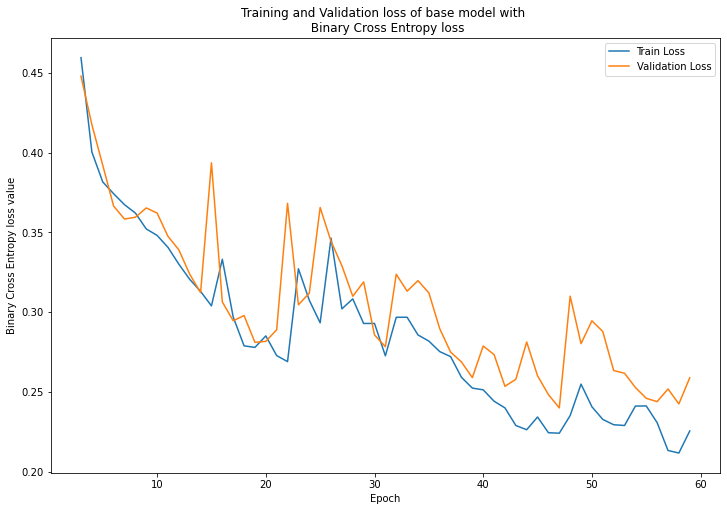

In [8]:
# Plot loss curves for train and validation set (excluding first 2 epochs to not mess up y-axis scaling)
results_path = modelname + "_results.csv"
plot_losses(results_path)

We can see that augmentation indeed narrows the gap between the validation and train loss, at the price of a worse train loss. However, it seems that a lot could be improved by choosing the optimal parameters for the augmentation strategy as the validation loss is a bit worse than what we got without augmentation at all. We would have loved to implemented an automatic hyperparameter tuning strategy, e.g. using Bayesian optimization, that looks at those parameters and the batch size and finds optimal values, but since we are limited in our time and computing ressources we refrain from doing so. 

Let us now compare our results with the case where we didn't recognized the wrongly labeled image. For this, we give the data set class the argument add_filenames which specifies the additional file (278) to use.

In [2]:
# Instantiate model
torch.manual_seed(42) # seed for reporducibility when using random weight initialization
model = UNet(256, 256).to(device)

# Set some parameters, instantiate the optimizer 
optimizer = torch.optim.Adam(model.parameters())
criterion = torch.nn.BCEWithLogitsLoss()
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.98)
batch_size = 4
epochs_to_try = 100
patience = 11
modelname = ".\\models\\base_u_net_wrong_label" # Name of the saved model and the results.csv
add_filename = "278.png"

# Augmentation params
augment_prob = {
        "p_hflip": 0.15,
        "p_vflip": 0.15,
        "p_rotation": 0.1,
        "p_noise" : 0.05,
        "p_hsv" : 0
    }
augment_params = {
    "noise_mean": 0.1,
    "noise_std": 1,
    "noise_scale": 0.002,
    "rot_angles": [-90, 90, 180],
    "hue_range": 0,
    "saturation_max": 0,
    "brightness_max": 0
}
augment_dict = {"probs": augment_prob, "params": augment_params}

# Create dataloaders from datasets with augmentation
train_data_loader = DataLoader(
    rooftops_dataset(".\\data\\train",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict,
                     add_filename=add_filename),
    shuffle=True,
    batch_size=batch_size
)
val_data_loader = DataLoader(
    rooftops_dataset(".\\data\\validation",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=False,
    batch_size=batch_size
)

dataloaders = {"train": train_data_loader,
               "validation": val_data_loader}

# Perform training
results = train_fun(model=model,
                    optimizer=optimizer,
                    data_loaders=dataloaders,
                    criterion=criterion,
                    device=device,
                    model_path=modelname,
                    scheduler=scheduler,
                    epochs=epochs_to_try,
                    patience=patience)

Epoch: 5 | Avg. Train Loss:  0.401 | Avg. Val Loss:  0.382 | Learning Rate:  0.00090
Epoch: 10 | Avg. Train Loss:  0.365 | Avg. Val Loss:  0.357 | Learning Rate:  0.00082
Epoch: 15 | Avg. Train Loss:  0.311 | Avg. Val Loss:  0.333 | Learning Rate:  0.00074
Epoch: 20 | Avg. Train Loss:  0.399 | Avg. Val Loss:  0.470 | Learning Rate:  0.00067
Epoch: 25 | Avg. Train Loss:  0.334 | Avg. Val Loss:  0.364 | Learning Rate:  0.00060


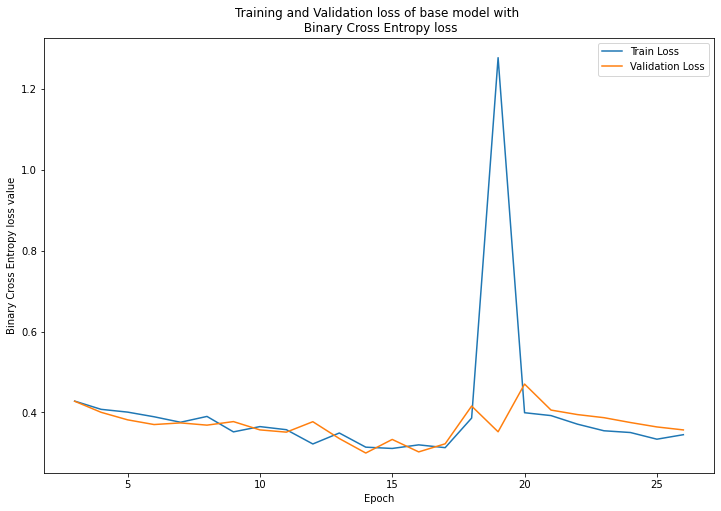

In [3]:
# Plot loss curves for train and validation set (excluding first 2 epochs to not mess up y-axis scaling)
results_path = modelname + "_results.csv"
plot_losses(results_path)

As expected the result look way worse than even the baseline model without any additions. Hence, we will continue with putting the wrongly labeled image in the test set folder and ignoring it during training and validation.

Finally, let us use a different loss function, namely the so called dice loss. It is born from the Dice coefficient, which in its original form is defined for two sets $X,Y$ as:
$$l_D(X,Y):= \frac{2|X \cap Y|)}{|X|+|Y|}$$
which when translated to a binary sets (i.e. $X,Y \subseteq \{0,1\}$) is defined as
$$l_D(X,Y):= \frac{2 TP}{2 TP + FN + FP},$$
where TP, FN, FP stand for true positive, false negative, and false positive, respectively. 

The main advantage of the dice loss is the fact that this similarity measure is exactly what we want to optimize, if we imagine $X$ and $Y$ being the predicted label and the true label and the pixel being its elements. It also helps us to deal with samples, which (in terms of pixels) do not have many rooftops in them (or more generally class imbalances). 

However, the Dice coefficient itself is non-differentiable so we have to make it differentiable, which can be done in the following manner:
Let $X \in [0,1]^{256 \times 256}$ be the predicted segmentation probabilities (logit converted into probabilities using the sigmoid function) and let $Y \in \{0,1\}^{256 \times 256}$ be the label mask. Then we define the soft dice loss as
$$l_D(X, Y):= 1- \frac{2\sum_{i,j=1}^{256} X_{i,j} Y_{i,j} }{\sum_{i,j=1}^{256} X_{i,j} + Y_{i,j}}.$$
For calculation efficiency reasons we also add a smoothing factor $\epsilon=1$ to both the nominator and denominator which then results in the soft dice loss. We then proceed to combine both soft dice loss and BCE by taking the average of both values.

In [36]:
# Instantiate model
torch.manual_seed(42) # seed for reporducibility when using random weight initialization
model = UNet(256, 256).to(device)

# Set some parameters, instantiate the optimizer 
optimizer = torch.optim.Adam(model.parameters())
criterion = DiceCrossEntropy() # Soft dice loss class
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.97)
batch_size = 4
epochs_to_try = 100
patience = 11
modelname = ".\\models\\base_u_net_lr_augment_dice_cross_loss" # Name of the saved model and the results.csv

# Augmentation params
augment_prob = {
        "p_hflip": 0.15,
        "p_vflip": 0.15,
        "p_rotation": 0.1,
        "p_noise" : 0.05,
        "p_hsv" : 0
    }
augment_params = {
    "noise_mean": 0.1,
    "noise_std": 1,
    "noise_scale": 0.002,
    "rot_angles": [-90, 90, 180],
    "hue_range": 0,
    "saturation_max": 0,
    "brightness_max": 0
}
augment_dict = {"probs": augment_prob, "params": augment_params}

# Create dataloaders from datasets with augmentation
train_data_loader = DataLoader(
    rooftops_dataset(".\\data\\train",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=True,
    batch_size=batch_size
)
val_data_loader = DataLoader(
    rooftops_dataset(".\\data\\validation",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=False,
    batch_size=batch_size
)

dataloaders = {"train": train_data_loader,
               "validation": val_data_loader}

# Perform training
results = train_fun(model=model,
                    optimizer=optimizer,
                    data_loaders=dataloaders,
                    criterion=criterion,
                    device=device,
                    model_path=modelname,
                    scheduler=scheduler,
                    epochs=epochs_to_try,
                    patience=patience)

Epoch: 5 | Avg. Train Loss:  0.593 | Avg. Val Loss:  0.554 | Learning Rate:  0.00086
Epoch: 10 | Avg. Train Loss:  0.545 | Avg. Val Loss:  0.533 | Learning Rate:  0.00074
Epoch: 15 | Avg. Train Loss:  0.487 | Avg. Val Loss:  0.518 | Learning Rate:  0.00063
Epoch: 20 | Avg. Train Loss:  0.463 | Avg. Val Loss:  0.449 | Learning Rate:  0.00054
Epoch: 25 | Avg. Train Loss:  0.456 | Avg. Val Loss:  0.399 | Learning Rate:  0.00047
Epoch: 30 | Avg. Train Loss:  0.343 | Avg. Val Loss:  0.339 | Learning Rate:  0.00040
Epoch: 35 | Avg. Train Loss:  0.402 | Avg. Val Loss:  0.411 | Learning Rate:  0.00034
Epoch: 40 | Avg. Train Loss:  0.308 | Avg. Val Loss:  0.365 | Learning Rate:  0.00030
Epoch: 45 | Avg. Train Loss:  0.257 | Avg. Val Loss:  0.312 | Learning Rate:  0.00025
Epoch: 50 | Avg. Train Loss:  0.263 | Avg. Val Loss:  0.283 | Learning Rate:  0.00022
Epoch: 55 | Avg. Train Loss:  0.244 | Avg. Val Loss:  0.297 | Learning Rate:  0.00019
Epoch: 60 | Avg. Train Loss:  0.213 | Avg. Val Loss:  0

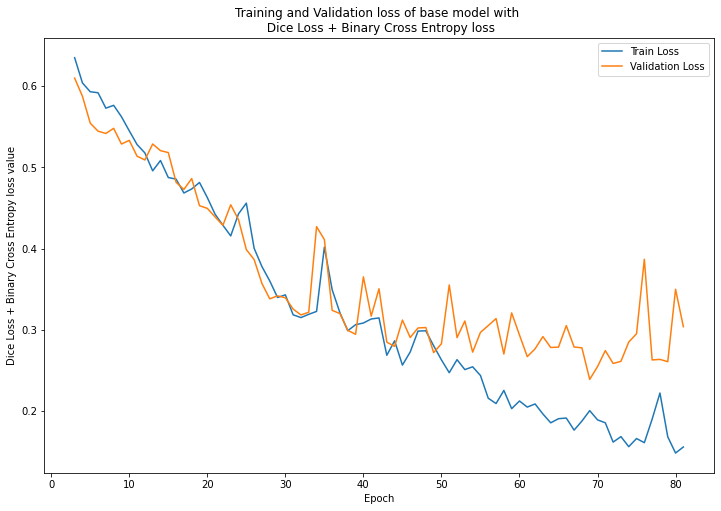

In [37]:
# Plot loss curves for train and validation set (excluding first 2 epochs to not mess up y-axis scaling)
results_path = modelname + "_results.csv"
plot_losses(results_path, loss_type="Dice Loss + Binary Cross Entropy")

We see that the combination of both losses now sometimes lead to higher spikes in the validation and train loss and at the end the gap between the validation and training loss starts to increase which points to overfitting. What is odd is the fact, that at the start of training, the validation loss is actually lower than the training loss. A closer inspections yields that this is due to the dice loss being higher for the train than for the validation set. Currently we cannot explain why this is, however overall results are better for the combined loss, as a comparison of the segmentation masks shows.

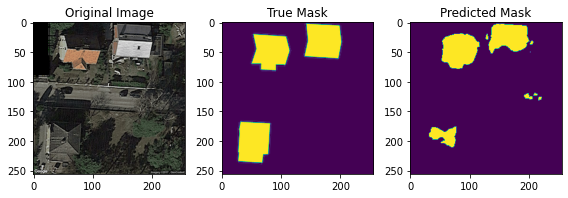

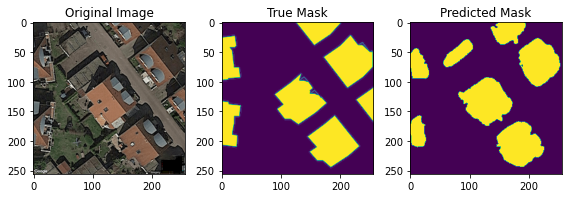

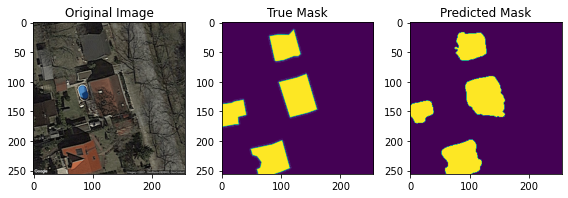

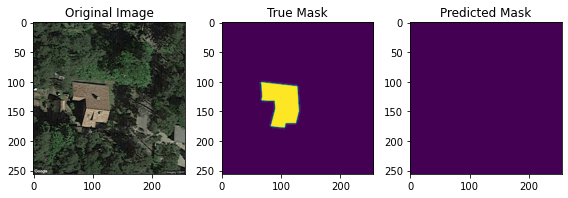

In [38]:
# Prediction plots for cross entropy + dice loss + augment + lr scheduler on validation set
generate_preds(".\\models\\base_u_net_lr_augment_dice_cross_loss_model",
               model, ".\\data\\validation", device)

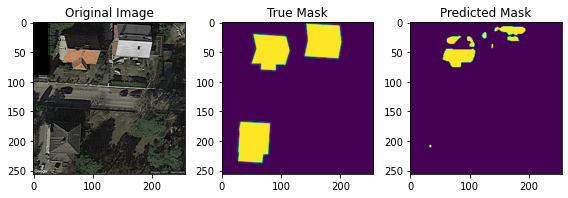

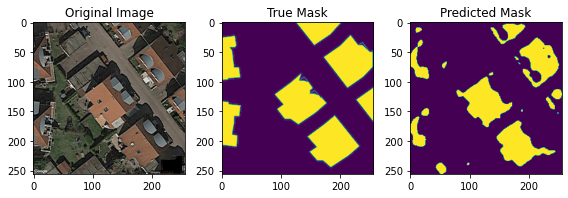

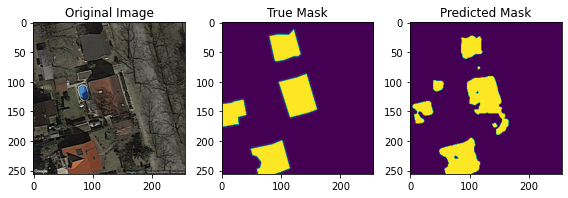

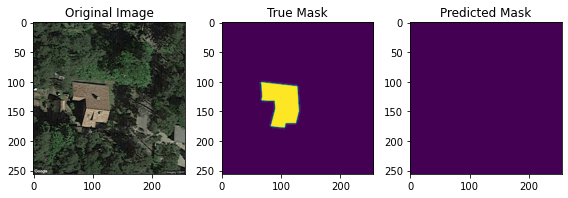

In [6]:
# Prediction plots for cross entropy + augment + lr scheduler on validation set
generate_preds(".\\models\\base_u_net_lr_augment_model",
               model, ".\\data\\validation", device)

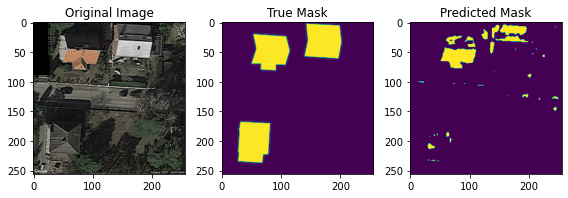

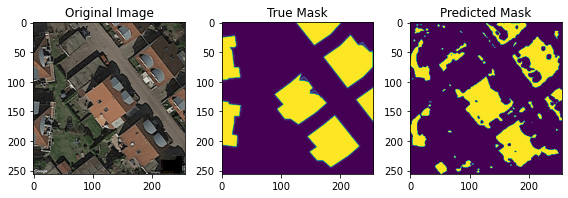

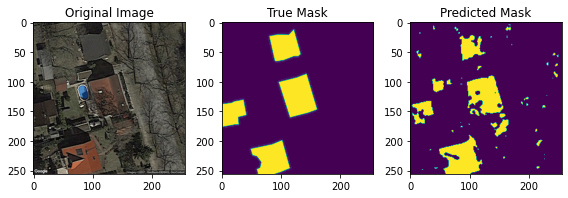

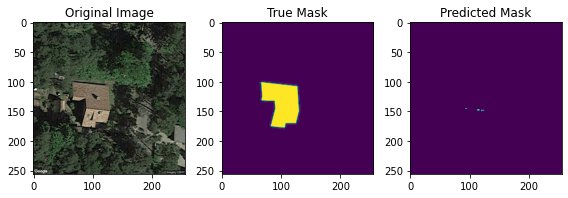

In [15]:
# Prediction plots for cross entropy on validation set
generate_preds(".\\models\\base_u_net_model",
               model, ".\\data\\validation", device)

As we can see, the model with the combined loss performs best out of those three. Additionally, we want to point out that augmentation and the lr scheduler improved the performance (in the sense of coherant segmentation masks) a lot. 

Let us also investigate the predictions for the train set for the last model and the model with cross-entropy loss.

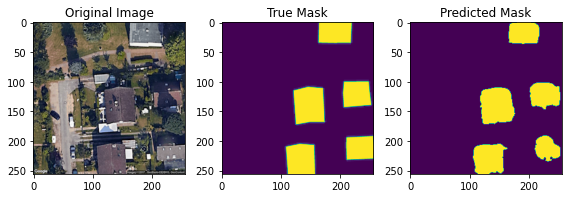

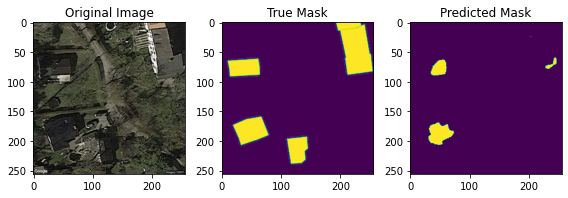

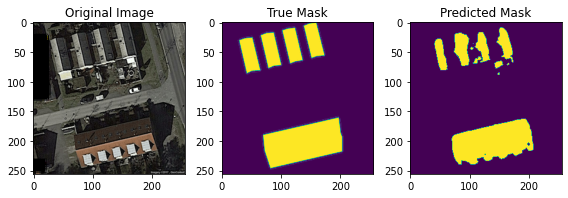

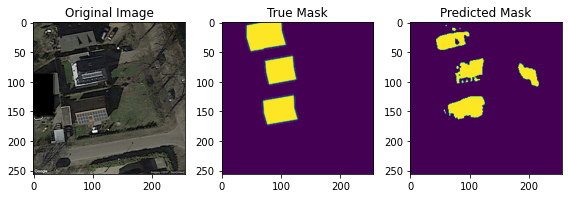

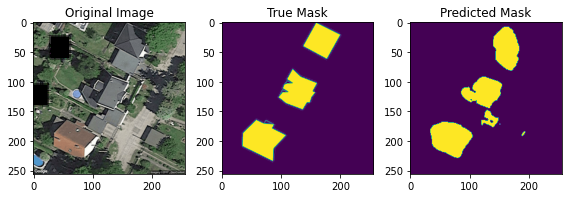

...

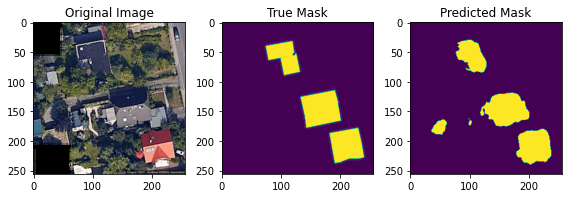

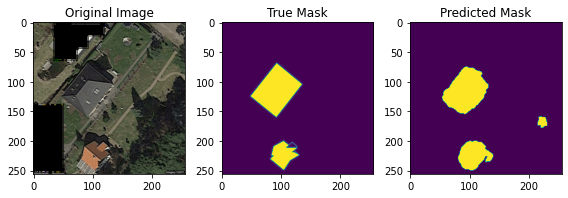

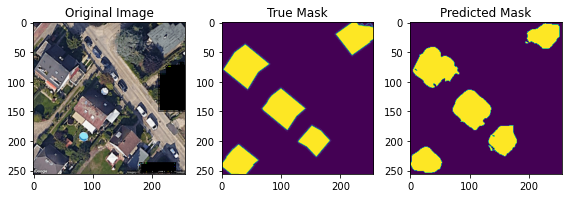

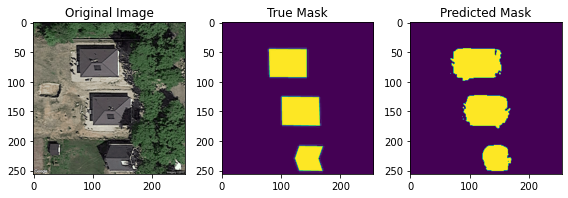

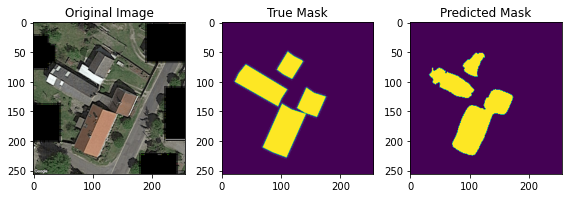

In [39]:
# Prediction plots for cross entropy + dice loss + augment + lr scheduler on train set
generate_preds(".\\models\\base_u_net_lr_augment_dice_cross_loss_model",
               model, ".\\data\\train", device)

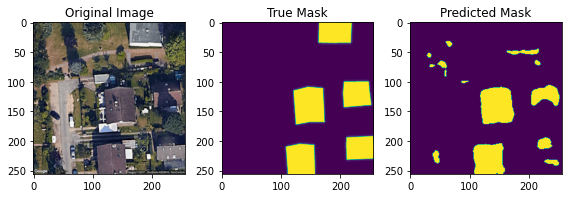

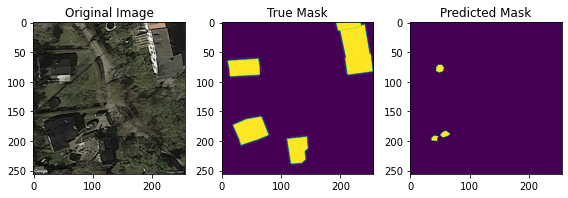

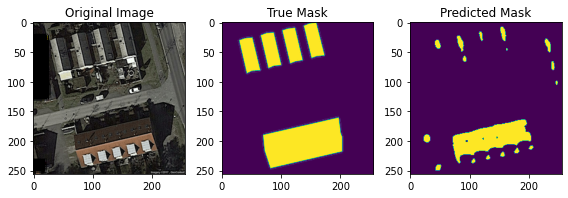

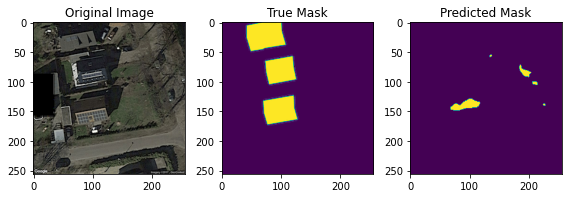

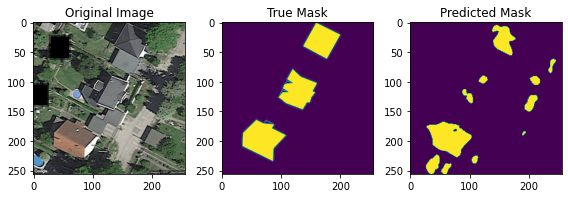

...

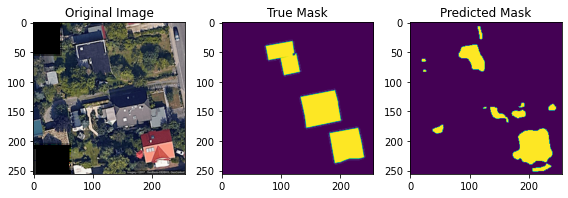

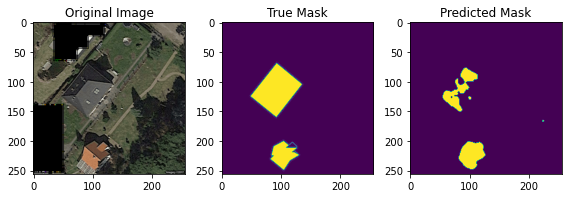

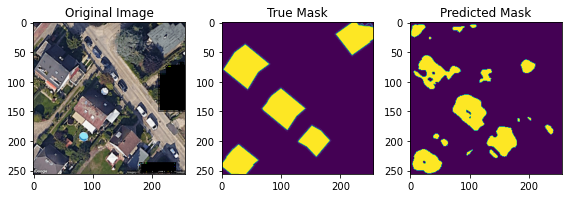

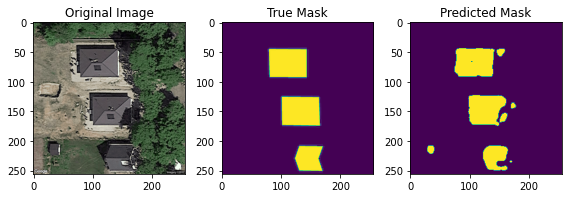

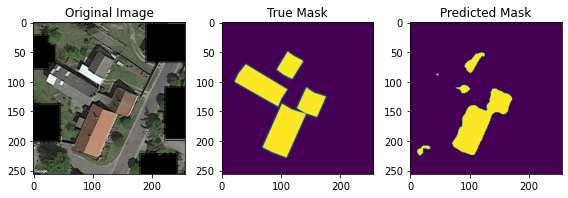

In [17]:
# Prediction plots for cross entropy + augment + lr scheduler on train set
generate_preds(".\\models\\base_u_net_lr_augment_model",
               model, ".\\data\\train", device)

We can see that the last model outperfroms all other models, however it seems still that there is a lot of room for improvement. For one, the last models seems to have some issues with identifying rooftops that are grey or have an overall darker shade of brown and blue. To check whether we can improve on this, let us try to augment images by changing the brightness, saturation, and hue of the images randomly, again with a small probability. 

In [31]:
# Instantiate model
torch.manual_seed(42) # seed for reporducibility when using random weight initialization
model = UNet(256, 256).to(device)

# Set some parameters, instantiate the optimizer 
optimizer = torch.optim.Adam(model.parameters())
criterion = DiceCrossEntropy() # Soft dice loss class
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.98)
batch_size = 4
epochs_to_try = 100
patience = 11
modelname = ".\\models\\base_u_net_lr_augment_dice_cross_loss_hsv" # Name of the saved model and the results.csv

# Augmentation params
augment_prob = {
        "p_hflip": 0.1,
        "p_vflip": 0.1,
        "p_rotation": 0.1,
        "p_noise" : 0.05,
        "p_hsv" : 0.05
    }
augment_params = {
    "noise_mean": 0.1,
    "noise_std": 1,
    "noise_scale": 0.002,
    "rot_angles": [-90, 90, 180],
    "hue_range": 0.1,
    "saturation_max": 0.02,
    "brightness_max": 0.02
}
augment_dict = {"probs": augment_prob, "params": augment_params}

# Create dataloaders from datasets with augmentation
train_data_loader = DataLoader(
    rooftops_dataset(".\\data\\train",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=True,
    batch_size=batch_size
)
val_data_loader = DataLoader(
    rooftops_dataset(".\\data\\validation",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=False,
    batch_size=batch_size
)

dataloaders = {"train": train_data_loader,
               "validation": val_data_loader}

# Perform training
results = train_fun(model=model,
                    optimizer=optimizer,
                    data_loaders=dataloaders,
                    criterion=criterion,
                    device=device,
                    model_path=modelname,
                    scheduler=scheduler,
                    epochs=epochs_to_try,
                    patience=patience)

Epoch: 5 | Avg. Train Loss:  1.096 | Avg. Val Loss:  1.064 | Learning Rate:  0.00090
Epoch: 10 | Avg. Train Loss:  1.051 | Avg. Val Loss:  1.022 | Learning Rate:  0.00082
Epoch: 15 | Avg. Train Loss:  0.996 | Avg. Val Loss:  1.011 | Learning Rate:  0.00074
Epoch: 20 | Avg. Train Loss:  0.979 | Avg. Val Loss:  0.968 | Learning Rate:  0.00067
Epoch: 25 | Avg. Train Loss:  0.940 | Avg. Val Loss:  0.878 | Learning Rate:  0.00060
Epoch: 30 | Avg. Train Loss:  0.904 | Avg. Val Loss:  0.881 | Learning Rate:  0.00055
Epoch: 35 | Avg. Train Loss:  0.907 | Avg. Val Loss:  0.927 | Learning Rate:  0.00049
Epoch: 40 | Avg. Train Loss:  0.881 | Avg. Val Loss:  0.871 | Learning Rate:  0.00045
Epoch: 45 | Avg. Train Loss:  0.826 | Avg. Val Loss:  0.852 | Learning Rate:  0.00040
Epoch: 50 | Avg. Train Loss:  0.816 | Avg. Val Loss:  0.835 | Learning Rate:  0.00036
Epoch: 55 | Avg. Train Loss:  0.807 | Avg. Val Loss:  0.924 | Learning Rate:  0.00033
Epoch: 60 | Avg. Train Loss:  0.774 | Avg. Val Loss:  0

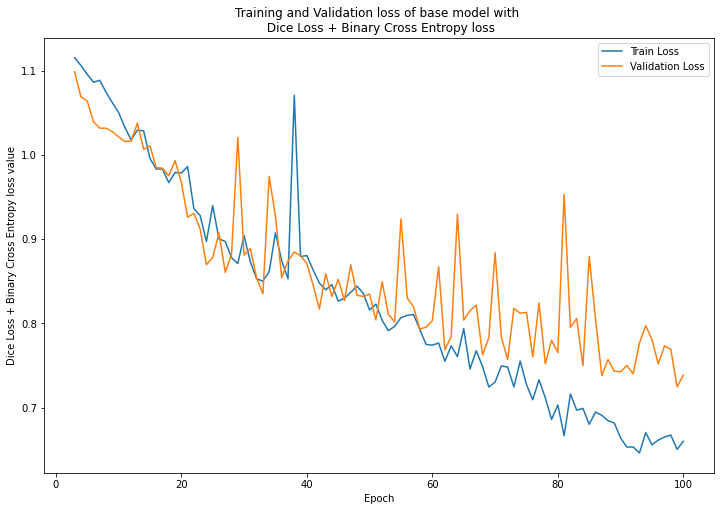

In [38]:
# Plot loss curves for train and validation set (excluding first 2 epochs to not mess up y-axis scaling)
results_path = modelname + "_results.csv"
plot_losses(results_path, loss_type="Dice Loss + Binary Cross Entropy")

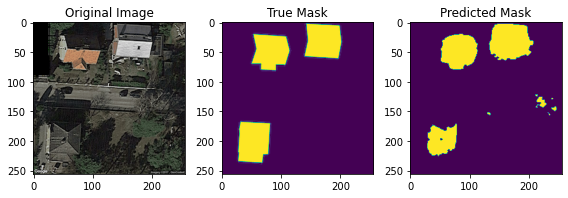

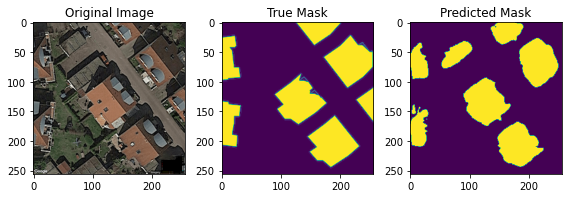

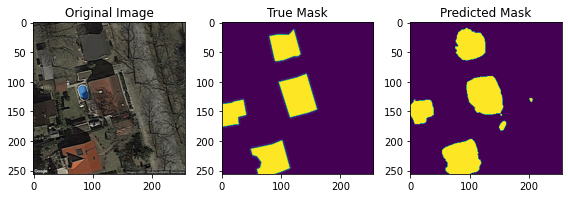

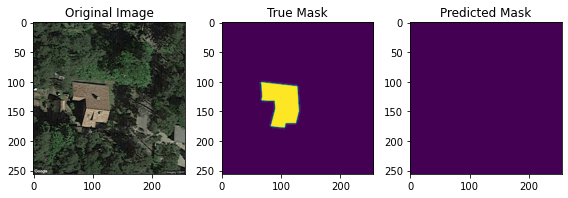

In [39]:
# Prediction plots for cross entropy + dice loss + augment + lr scheduler on validation set
generate_preds(".\\models\\base_u_net_lr_augment_dice_cross_loss_hsv_model",
               model, ".\\data\\validation", device)

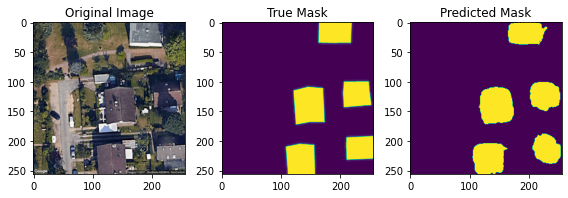

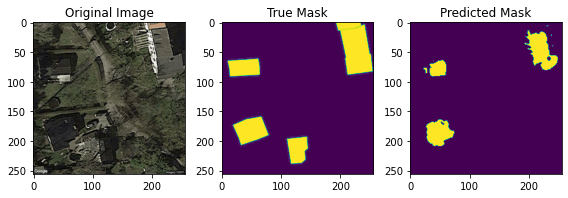

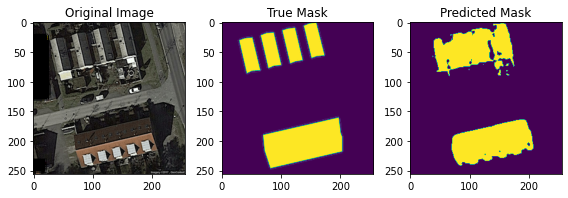

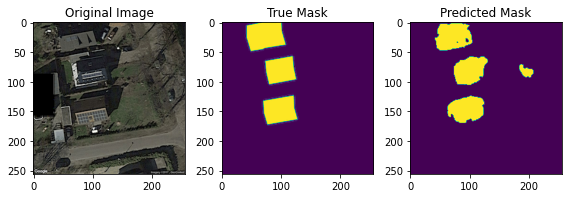

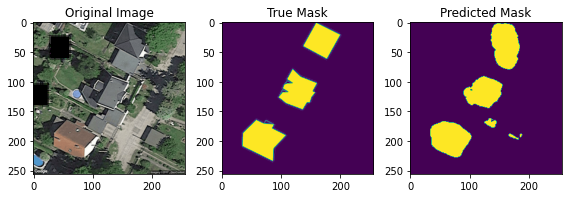

...

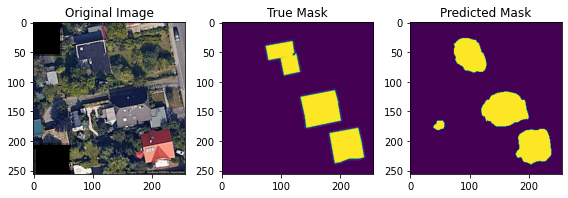

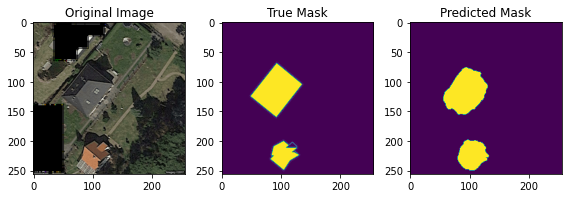

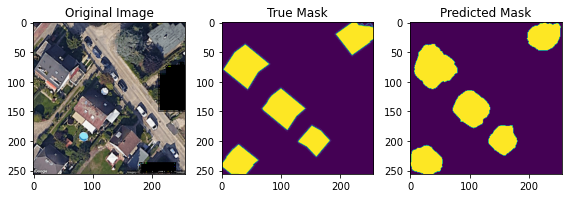

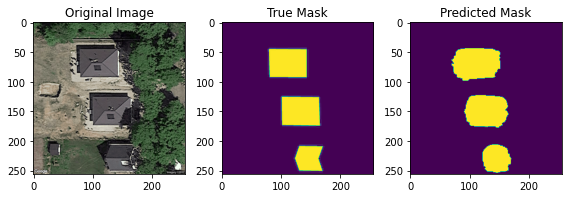

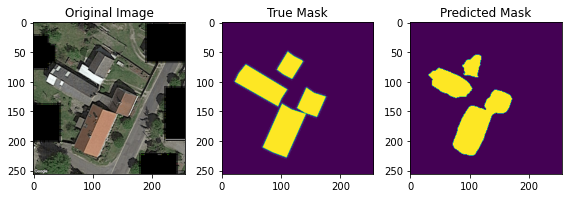

In [40]:
# Prediction plots for cross entropy + augment + lr scheduler on train set
generate_preds(".\\models\\base_u_net_lr_augment_dice_cross_loss_hsv_model",
               model, ".\\data\\train", device)

We can see that our augmentation approach improved the model furthermore, although the one house in the forrest in the validation set can still not be identified and training seems to be unstable now. We suspect, that the reason behind the former is the fact, that most of the images in the train set contain usally more than one house which are also located at a clearly visible street without too many trees. Alas, we currently do not have an idea on how to improve the model in this regard, except allowing for more samples, where some of those also include edge cases like this. For the later we would assume that optimizing the augmentation parameters would yield more stable results, as well as limiting the number of augmentation that can be performed on an image at a time.

Let us now summarize our approach and also give an outlook on stuff we would have liked to test, but couldn't due to time constraints. At the end of this we also show a training run with a dynamic learning rate scheduler, which did however not increase performance. 

# 3. Summary and Outlook
As dida sold their solution to Enpal, I assume that they have (nearly) solved that task and I would be curious on how they did it. Nevertheless, our simplistic approach still yielded relatively solid results, when taking the small sample size and the difficulty of task into consideration. 

We started with a basic U-net architecture, continued with a learning rate scheduler, implemented various augmentations that where applied on the fly during training, and finally incorporated the soft dice loss into the training process. We identified the wrongly labeled image and showed, that if one ignores this image, training will most probably fail and we also applied measures to prevent the model from overfitting on censored image parts. We also made our model more robust in terms of different rooftop colors and shading, while still improving on the validation error. Our code is well documented and adheres to the most basic engineering principles while this notebook visualized our learning journey vividly. All in all this was a fun task that enticed my curiosity and I hope my presentation is well recived. 

The following (non-exhaustive) list contains some further ideas I would have loved to try but couldn't due to time constraints. 
- Test various extensions of the U-net architecture (e.g. described here https://arxiv.org/ftp/arxiv/papers/2011/2011.01118.pdf)
- Use SWIN and perform transfer learning
- Automatic hyperparameter tuning (e.g. using Bayesian optimization)
- Adjust augmentation procedure to reduce over augmentation of single images
- Investigate why the validation loss is sometimes lower than the train loss when using dice loss (even with BCE loss)

Finally, let us use our last model to predict the segmentation masks for the test set and save the results. 

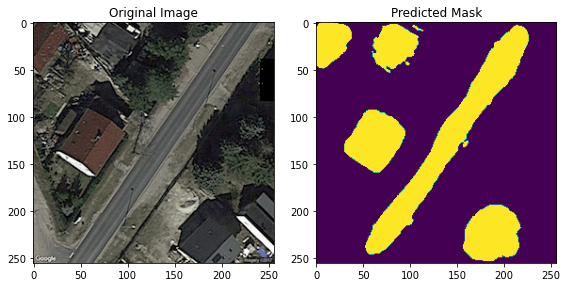

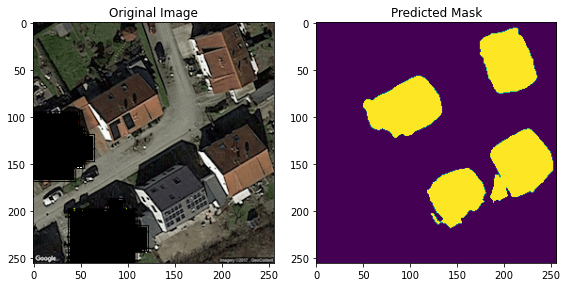

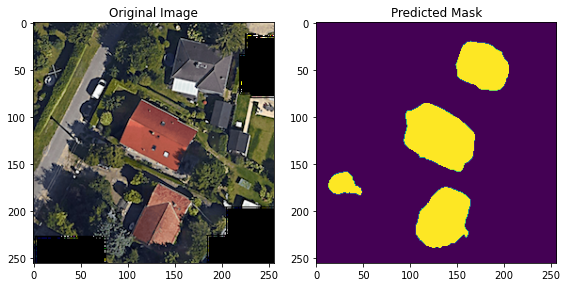

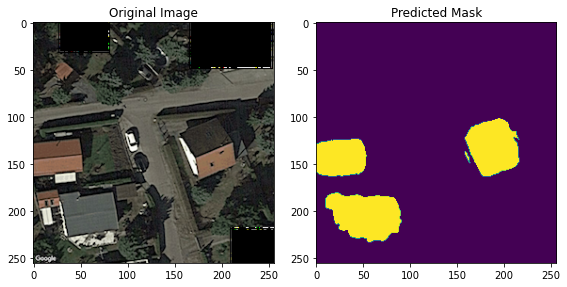

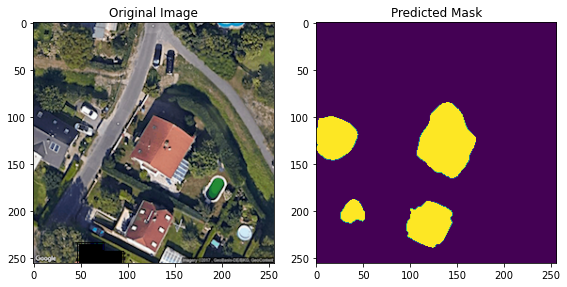

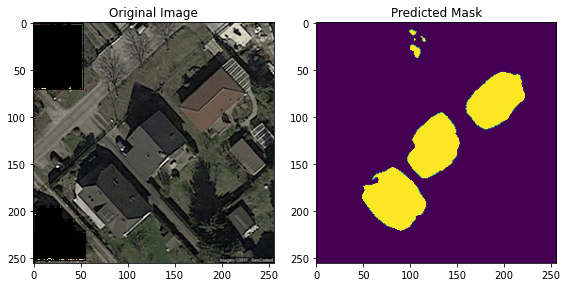

Saving predictions complete.


In [2]:
generate_preds(".\\models\\base_u_net_lr_augment_dice_cross_loss_hsv_model",
               model, ".\\data\\test", device, test_set=True)

Dynamic learning rate scheduler, settings are the same as for the last model. The results here are posted only for completness.

In [41]:
# Instantiate model
torch.manual_seed(42) # seed for reporducibility when using random weight initialization
model = UNet(256, 256).to(device)

# Set some parameters, instantiate the optimizer 
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = DiceCrossEntropy() # Soft dice loss class
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                       mode="min",
                                                      factor=0.5,
                                                      patience=5, 
                                                      cooldown=1)
batch_size = 4
epochs_to_try = 100
patience = 11
modelname = ".\\models\\base_u_net_lr_augment_dice_cross_loss_hsv_2" # Name of the saved model and the results.csv

# Augmentation params
augment_prob = {
        "p_hflip": 0.1,
        "p_vflip": 0.1,
        "p_rotation": 0.1,
        "p_noise" : 0.05,
        "p_hsv" : 0.05
    }
augment_params = {
    "noise_mean": 0.1,
    "noise_std": 1,
    "noise_scale": 0.002,
    "rot_angles": [-90, 90, 180],
    "hue_range": 0.1,
    "saturation_max": 0.02,
    "brightness_max": 0.02
}
augment_dict = {"probs": augment_prob, "params": augment_params}

# Create dataloaders from datasets with augmentation
train_data_loader = DataLoader(
    rooftops_dataset(".\\data\\train",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=True,
    batch_size=batch_size
)
val_data_loader = DataLoader(
    rooftops_dataset(".\\data\\validation",
                     transform=T.ToTensor(),
                     augment=True,
                     augment_dict=augment_dict),
    shuffle=False,
    batch_size=batch_size
)

dataloaders = {"train": train_data_loader,
               "validation": val_data_loader}

# Perform training
results = train_fun(model=model,
                    optimizer=optimizer,
                    data_loaders=dataloaders,
                    criterion=criterion,
                    device=device,
                    model_path=modelname,
                    scheduler=scheduler,
                    scheduler_type="dynamic",
                    epochs=epochs_to_try,
                    patience=patience)

Epoch: 5 | Avg. Train Loss:  1.083 | Avg. Val Loss:  1.031 | Learning Rate:  0.00100
Epoch: 10 | Avg. Train Loss:  1.001 | Avg. Val Loss:  1.222 | Learning Rate:  0.00100
Epoch: 15 | Avg. Train Loss:  0.974 | Avg. Val Loss:  0.954 | Learning Rate:  0.00100
Epoch: 20 | Avg. Train Loss:  2.322 | Avg. Val Loss:  3.240 | Learning Rate:  0.00100
Epoch: 25 | Avg. Train Loss:  0.904 | Avg. Val Loss:  0.937 | Learning Rate:  0.00100
Epoch: 30 | Avg. Train Loss:  1.053 | Avg. Val Loss:  0.979 | Learning Rate:  0.00100
Epoch: 35 | Avg. Train Loss:  0.913 | Avg. Val Loss:  0.904 | Learning Rate:  0.00050
Epoch: 40 | Avg. Train Loss:  0.890 | Avg. Val Loss:  0.886 | Learning Rate:  0.00050


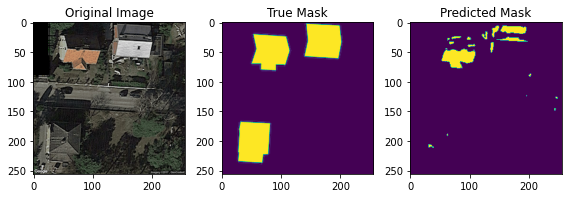

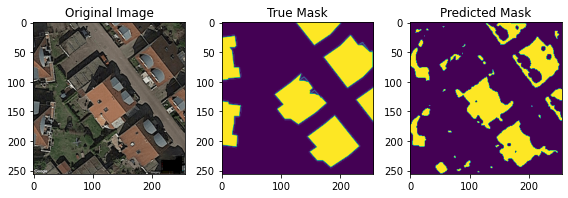

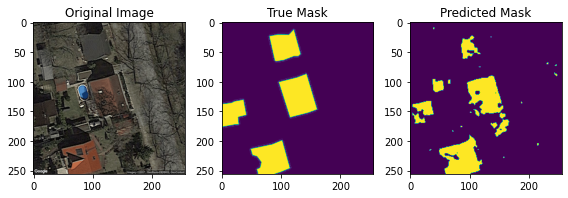

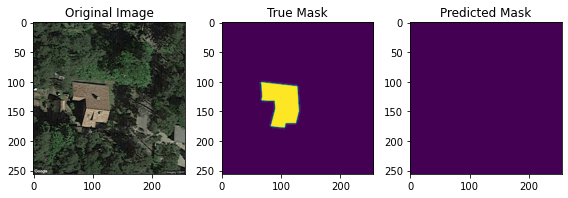

In [43]:
# Prediction plots for cross entropy + dice loss + augment + dynamic lr scheduler on validation set
generate_preds(".\\models\\base_u_net_lr_augment_dice_cross_loss_hsv_2_model",
               model, ".\\data\\validation", device)